# Ethylene excited state ePS results: MFPADs
20/03/25

- 2nd test, with channels:
    - orb7 > 10 > D1 (pi-pi*)
    - orb8 > 10 > D0 (sigma-pi*)
    - DATADIR: `/home/jovyan/jake-home/ePS/ethylene_2025/ethylene_sig-pi`

- 1st tests for excited states, 1st excited state only (orb9), no alignment.
    - Seems to be some issues with files, maybe low(est) E point(s)...?
    - Allow for SF = NaN case.
    - Need to check for case where Eke won't stack.
    - TODO: debug routine to check file IO more carefully. Currently a total mess to try and debug via classes.
    - FILE: `ethylene_es_MF_proc_ePSproc_200325-v1-es-dir.ipynb`, 
    - DATADIR: `/home/jovyan/jake-home/ePS/ethylene_2025/ethylene_es` first set of excited states (named by ionizing orb only).
    

---

For methods: https://epsproc.readthedocs.io/en/dev/demos/ePSproc_class_demo_161020.html

Most recent ePSproc template: https://phockett.github.io/ePSdata/CO2-preliminary/CO2_orbs8-11_MF_polRotDep_220824-tidy-v290125.html

## Setup

In [1]:
%matplotlib inline

# Quick hack to override default HTML template
# NOT required in some JLab versions.
# https://stackoverflow.com/a/63777508
# https://stackoverflow.com/questions/21971449/how-do-i-increase-the-cell-width-of-the-jupyter-ipython-notebook-in-my-browser
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))



/tmp/ipykernel_111849/843188395.py:7: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [2]:
import sys
import os
from pathlib import Path
import numpy as np
# import epsproc as ep
import xarray as xr

import matplotlib.pyplot as plt

from datetime import datetime as dt
timeString = dt.now()

import epsproc as ep

# Plotters
from epsproc.plot import hvPlotters

# Multijob class dev code
from epsproc.classes.multiJob import ePSmultiJob

hvPlotters.setPlotters(width = 700, snsStyle='whitegrid')

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


* sparse not found, sparse matrix forms not available. 
* natsort not found, some sorting functions not available. 


* Setting plotter defaults with epsproc.basicPlotters.setPlotters(). Run directly to modify, or change options in local env.


* Set Holoviews with bokeh.
* pyevtk not found, VTK export not available. 


* Set Holoviews with bokeh.


In [3]:
# # For class, above settings don't take, not sure why, something to do with namespaces/calling sequence?
# # Overriding snsStyle does work however... although NOT CONSISTENTLY????
# # AH, looks like ordering matters - set_style LAST (.set seems to override)
# import seaborn as sns

# sns.set(rc={'figure.figsize':(10,6)})  # Set figure size in inches
# sns.set_context("paper")
# sns.set_style("whitegrid")  # Set plot style
# sns.set_palette("Paired")   # Set colour mapping

# # Try direct fig type setting for PDF output figs
# from IPython.display import set_matplotlib_formats
# # set_matplotlib_formats('png', 'pdf')
# set_matplotlib_formats('svg', 'pdf')

In [4]:
# xr.set_options(display_style='html')

## Load data

In [5]:
# import warnings
# # warnings.filterwarnings('once')   # Skip repeated numpy deprecation warnings in current build (xr15 env)
# warnings.filterwarnings('ignore')   # Skip repeated numpy deprecation warnings in current build (xr15 env)

In [6]:
# # Scan for subdirs, based on existing routine in getFiles()

# fileBase = Path('/home/paul/ePS/OCS/OCS_survey')  # Data dir on Stimpy

# fileBase = Path('/home/paul/fock-mount/globalhome/eps/N2O/N2O_valence') # Data dir on Jake

# fileBase = Path('/home/jovyan/jake-home/femtobackSSHFS/FemtoShare/Results/ePolyScat_stuff/co2') # Data dir on Jake via Docker QM3 container

# fileBase = Path('/home/jovyan/fock-mount/globalhome/eps/ethylene_2025/ethylene_valence/orb9_AG/completed') # Data dir on Jake - test results only
# fileBase = Path('/home/jovyan/jake-home/ePS/ethylene_2025/ethylene_es')  # Initial ES runs, March 2025
fileBase = Path('/home/jovyan/jake-home/ePS/ethylene_2025/ethylene_sig-pi')  # orb7, orb8 excitations, 26/03/25

In [7]:
ep.__file__

'/home/jovyan/code-share/github-share/ePSproc/epsproc/__init__.py'

In [8]:
# TODO: fix orb label here, currently relies on (different) fixed format

data = ePSmultiJob(fileBase, verbose = 1, ext='.out', jobStructure='subDirs')  # TODO: fix subDirs usage!
                                                                                    # CO2 case: fix by setting .inp.out, otherwise also reads base dir (older results)

# data.scanFiles(outputKeyType='orb')  #, stackE = False)   # For ethylene 1st excited state seems to read OK with stackE=False? Not sure why... NEED SOME FILE CHECK/DEBUG CODE?
data.scanFiles(outputKeyType='dir')  #, stackE = False)
# data.jobsSummary()

Scanning /home/jovyan/jake-home/ePS/ethylene_2025/ethylene_sig-pi for ePS jobs.
Found ePS output files in subdirs: [PosixPath('/home/jovyan/jake-home/ePS/ethylene_2025/ethylene_sig-pi/orb8-orb10_B1U'), PosixPath('/home/jovyan/jake-home/ePS/ethylene_2025/ethylene_sig-pi/orb7-orb10_B1U')]
Found 2 directories, with 8 files.

*** Job orb8-orb10_B1U details
Key: orb8-orb10_B1U
Dir /home/jovyan/jake-home/ePS/ethylene_2025/ethylene_sig-pi/orb8-orb10_B1U, 4 file(s).
{   'batch': 'ePS ethylene_2025, batch ethylene_valence, orbital orb10_B1U',
    'event': 'orb 10 (B1U/D2h) ionization, batch ethylene_valence, None.',
    'orbE': 1.3687327281731962,
    'orbLabel': 'orb8-orb10_B1U',
    'symmetryLabel': 'B1U/D2h'}

*** Job orb7-orb10_B1U details
Key: orb7-orb10_B1U
Dir /home/jovyan/jake-home/ePS/ethylene_2025/ethylene_sig-pi/orb7-orb10_B1U, 4 file(s).
{   'batch': 'ePS ethylene_2025, batch ethylene_es, orbital orb10_B1U',
    'event': 'orb 10 (B1U/D2h) ionization, batch ethylene_es, None.',
    '

In [9]:
data.data.keys()

dict_keys(['orb8-orb10_B1U', 'orb7-orb10_B1U', 'stacked'])

In [10]:
data.jobs

{'fileBase': PosixPath('/home/jovyan/jake-home/ePS/ethylene_2025/ethylene_sig-pi'),
 'ext': '.out',
 'prefix': None,
 'jobDirs': [PosixPath('/home/jovyan/jake-home/ePS/ethylene_2025/ethylene_sig-pi/orb8-orb10_B1U'),
  PosixPath('/home/jovyan/jake-home/ePS/ethylene_2025/ethylene_sig-pi/orb7-orb10_B1U')],
 'jobStructure': 'subDirs',
 'files': {0: {'dir': PosixPath('/home/jovyan/jake-home/ePS/ethylene_2025/ethylene_sig-pi/orb8-orb10_B1U'),
   'fN': 4,
   'key': 'orb8-orb10_B1U',
   'fileList': ['/home/jovyan/jake-home/ePS/ethylene_2025/ethylene_sig-pi/orb8-orb10_B1U/ethylene_valence.orb10_B1U_E0.1_4.0_48.1eV.out',
    '/home/jovyan/jake-home/ePS/ethylene_2025/ethylene_sig-pi/orb8-orb10_B1U/ethylene_valence.orb10_B1U_E1.1_4.0_49.1eV.out',
    '/home/jovyan/jake-home/ePS/ethylene_2025/ethylene_sig-pi/orb8-orb10_B1U/ethylene_valence.orb10_B1U_E2.1_4.0_50.1eV.out',
    '/home/jovyan/jake-home/ePS/ethylene_2025/ethylene_sig-pi/orb8-orb10_B1U/ethylene_valence.orb10_B1U_E3.1_4.0_51.1eV.out']},
 

## Molecule info

Note orbital numbering in table below:

- `Orb` is Gamess file output orbital numbering, ordered by energy but not grouped by degeneracy.
- `OrbGrp` is grouped numbering by degeneracy, also used by ePolyScat, and will be used for labels etc. below.

For ethylene case channels were defined as:

- orb7 > 10 > D1 (pi-pi*)
- orb8 > 10 > D0 (sigma-pi*)

In both cases the initial state has an e- in Orb10 (promoted from Orb7 or Orb8), which is then ionized.

*** Molecular structure


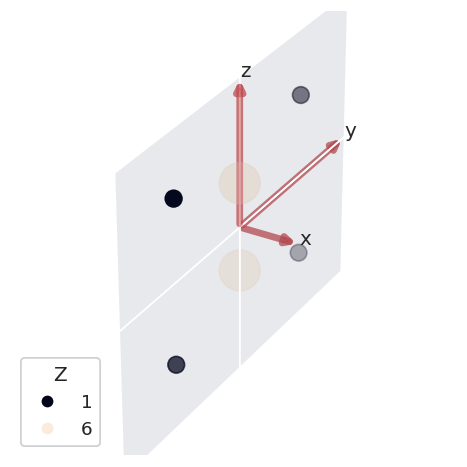


*** Molecular orbital list (from ePS output file)
EH = Energy (Hartrees), E = Energy (eV), NOrbGrp, OrbGrp, GrpDegen = degeneracies and corresponding orbital numbering by group in ePS, NormInt = single centre expansion convergence (should be ~1.0).


props,Sym,SymOrb,EH,Occ,E,NOrbGrp,OrbGrp,GrpDegen,NormInt
orb,,,,,,,,,
1,AG,0.0,-11.2385,2.0,-305.815164,1.0,1.0,1.0,0.999386
2,B1U,0.0,-11.2367,2.0,-305.766184,1.0,2.0,1.0,0.999386
3,AG,0.0,-1.0395,2.0,-28.286236,1.0,3.0,1.0,0.999386
4,B1U,0.0,-0.7933,2.0,-21.586793,1.0,4.0,1.0,0.999386
5,B2U,0.0,-0.6450,2.0,-17.551344,1.0,5.0,1.0,0.999386
6,AG,0.0,-0.5904,2.0,-16.065602,1.0,6.0,1.0,0.999386
7,B3G,0.0,-0.5055,2.0,-13.755356,1.0,7.0,1.0,0.999386
8,B3U,0.0,-0.3793,2.0,-10.321279,1.0,8.0,1.0,0.999386
9,AG,0.0,0.0404,0.0,1.099340,1.0,9.0,1.0,0.999386


In [11]:
data.molSummary()

## LF results (isotropic case)

Directly from ePS output:

- Cross-sections (XS) in Mbarn.
- Betas (B2) normalised to Legenre Polynomial expansion.

Plots below for channel and type (=Length, Velocity or Mixed gauge).

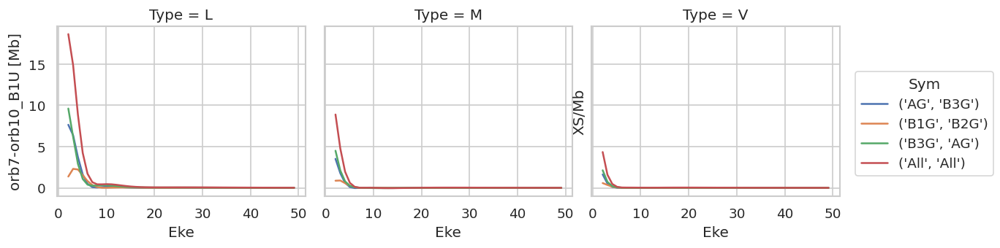

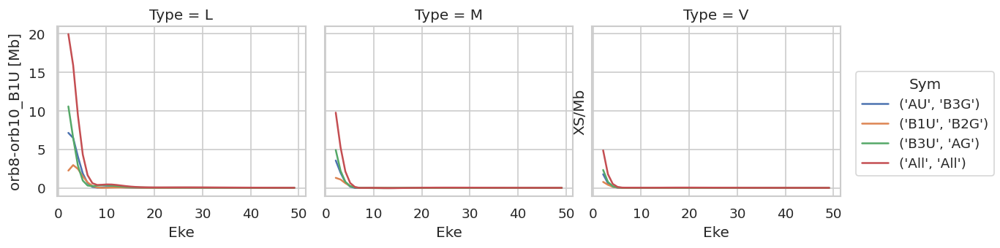

In [12]:
# Minimal method call will plot cross-sections for all ePS jobs found in the data directory.
data.plotGetCro(Erange=[2,50])

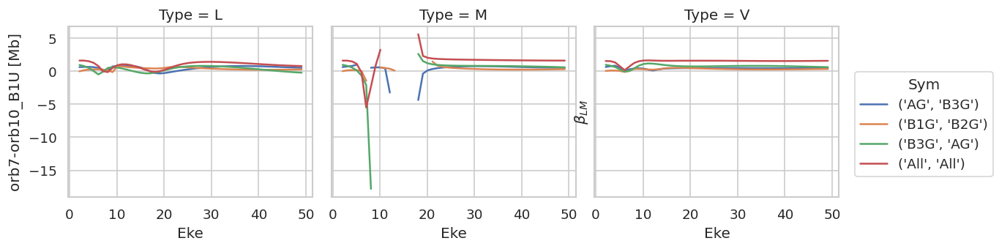

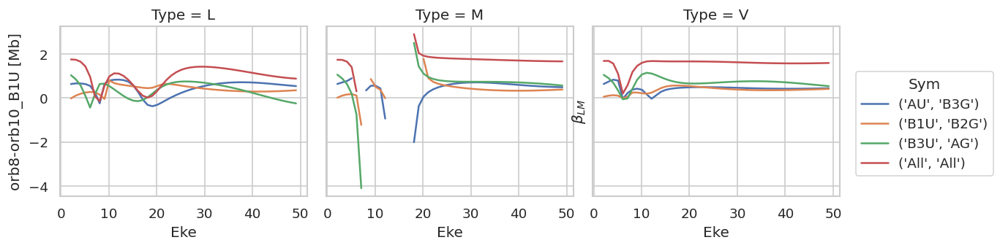

In [13]:
# Minimal method call will plot cross-sections for all ePS jobs found in the data directory.
data.plotGetCro(Erange=[2,50], pType='BETA')

In [14]:
# # import matplotlib.pyplot as plt
# # plt.rcParams["figure.figsize"] = [50,10]
# # from pylab import rcParams
# # rcParams['figure.figsize'] = 10, 10



# # Minimal method call will plot cross-sections for all ePS jobs found in the data directory.
# hvPlotters.setPlotters(width = 1200, height=1200, snsStyle='whitegrid')
# data.plotGetCro(Erange=[2,50], pType='BETA', selDims = {'Type':['L']})  #, backend = 'hv')

# # import matplotlib as mpl
# # fig = mpl.pyplot.gcf()
# # fig.set_size_inches(18.5, 10.5)
# # fig.savefig('test2png.png', dpi=100)

In [15]:
# import matplotlib as mpl
# fig = mpl.pyplot.gcf()
# fig.set_size_inches(18.5, 10.5)
# fig.savefig('test2png.png', dpi=100)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
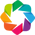

* Set Holoviews with bokeh.
getCro data and plots to self.plots['SIGMA']


:NdOverlay   [Orb]
   :Curve   [Eke]   (XS)

getCro data and plots to self.plots['BETA']


:NdOverlay   [Orb]
   :Curve   [Eke]   (XS)

In [16]:
hvPlotters.setPlotters(width = 800, height=500)
data.plotGetCroComp(backend = 'hv')
data.plotGetCroComp(pType = 'BETA', backend = 'hv')

## Matrix elements

Raw matrix elements.

Plotting data ethylene_es.orb10_B1U_E0.1_4.0_48.1eV.out, pType=a, thres=0.1, with Seaborn
Plotting data ethylene_valence.orb10_B1U_E0.1_4.0_48.1eV.out, pType=a, thres=0.1, with Seaborn


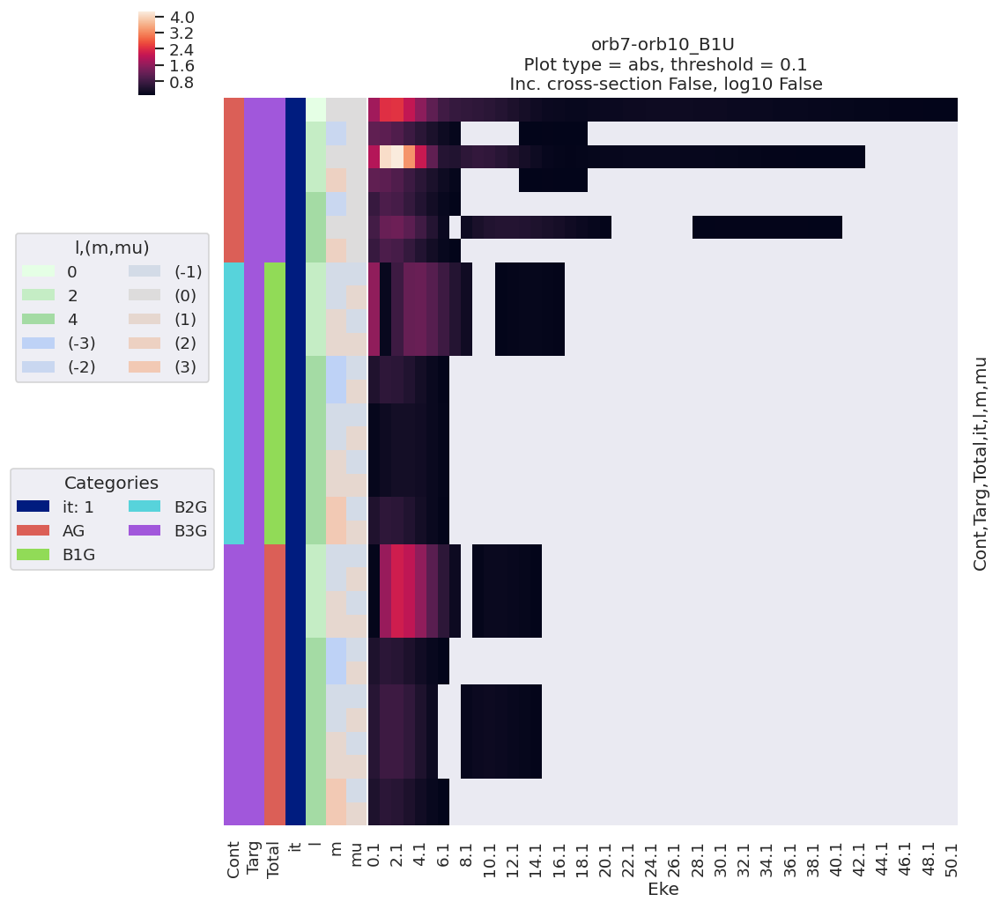

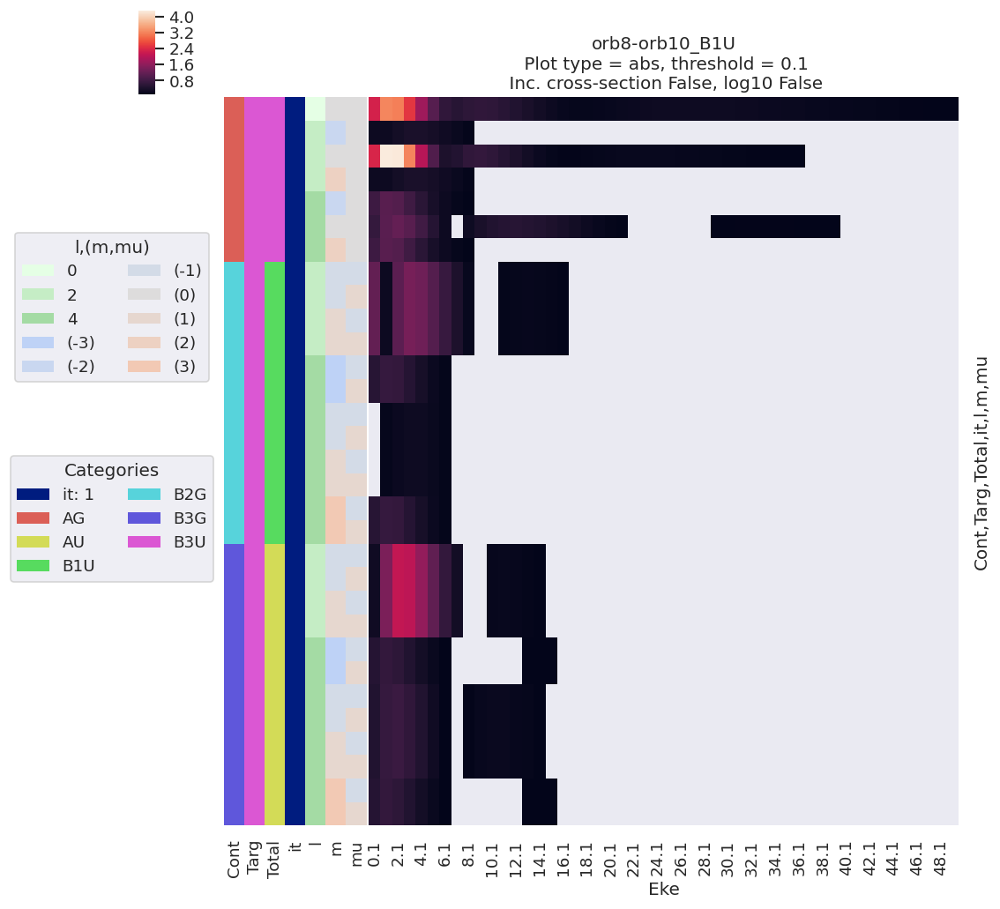

In [17]:
%matplotlib inline
thres = 0.1
data.lmPlot(selDims={'Type':'L'}, thres=thres)

Plotting data ethylene_es.orb10_B1U_E0.1_4.0_48.1eV.out, pType=phaseUW, thres=0.1, with Seaborn
Plotting data ethylene_valence.orb10_B1U_E0.1_4.0_48.1eV.out, pType=phaseUW, thres=0.1, with Seaborn


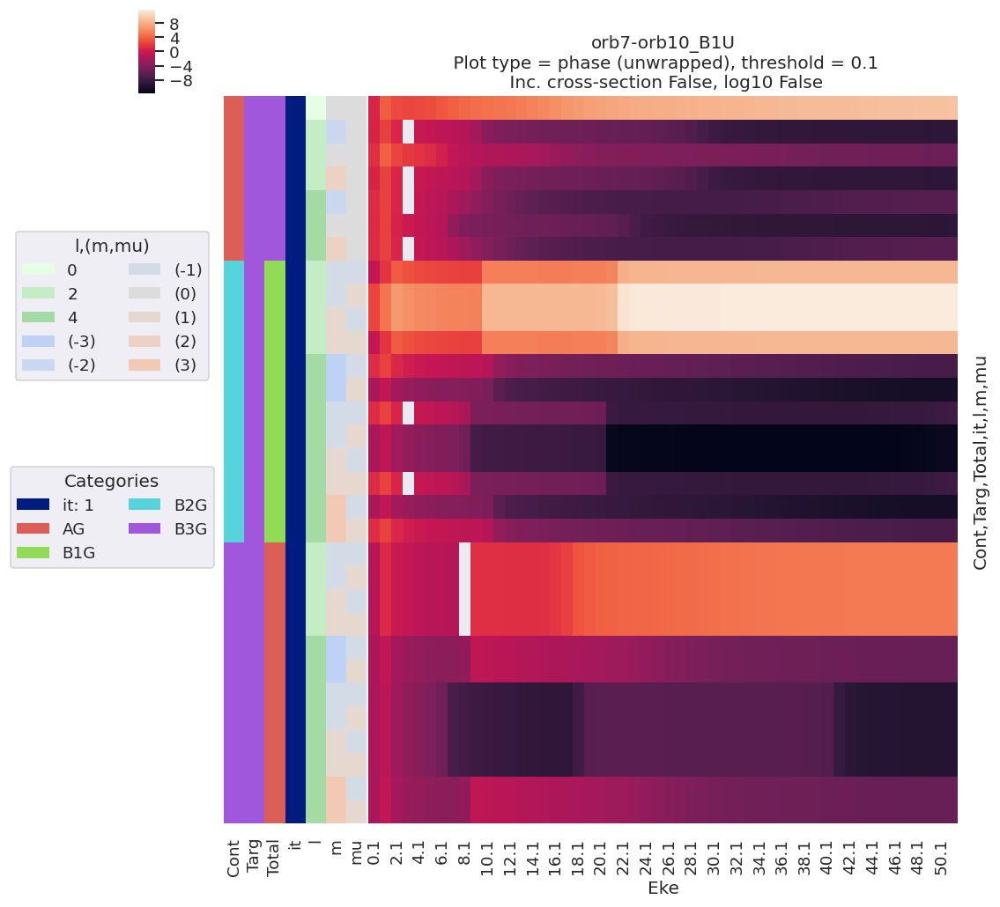

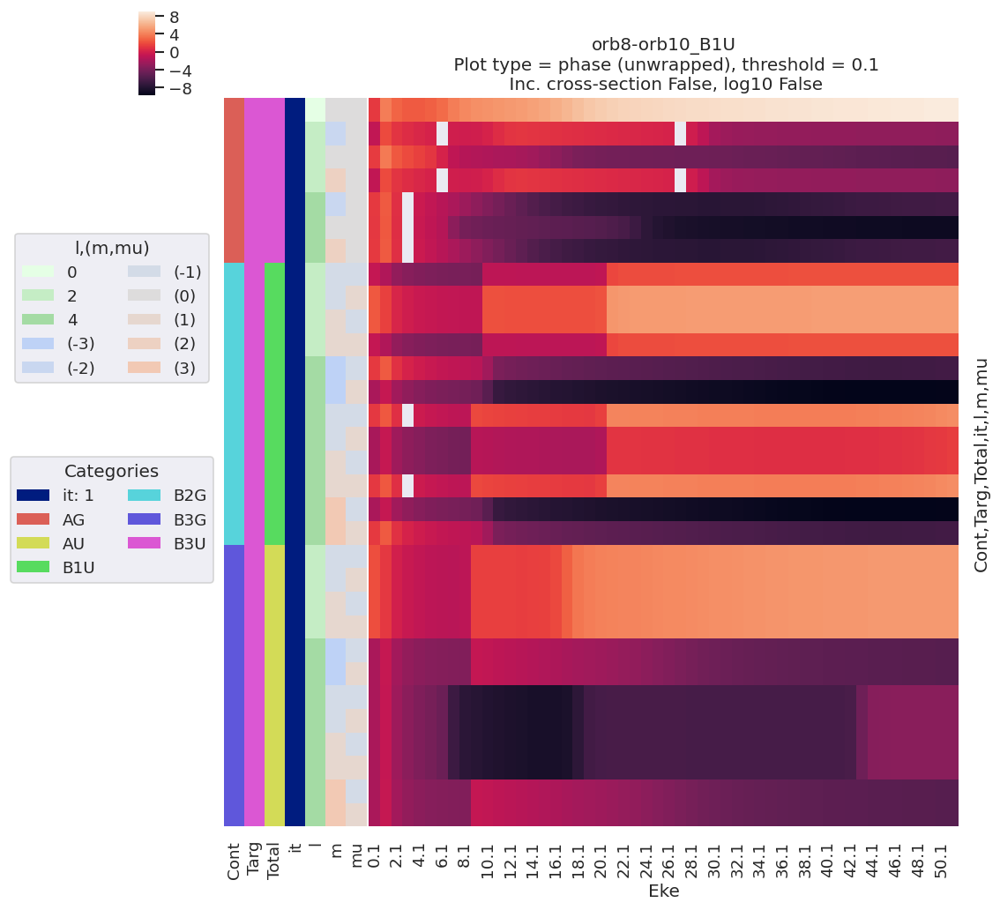

In [18]:
%matplotlib inline
data.lmPlot(selDims={'Type':'L'}, thres=thres, pType='phaseUW')

## MF results

BLM for MF case (note interactive plots).

In [19]:
data.MFBLM()


Calculating MF-BLMs for job key: orb7-orb10_B1U

Calculating MF-BLMs for job key: orb8-orb10_B1U


In [20]:
data.BLMplot(dataType='MFBLM', thres = 1e-4, backend='hv') 

Applying MFBLM plot defaults, pass overrideMF=True to skip.
BLMplot set data and plots to self.plots['BLMplot']


:HoloMap   [Orb,Labels]
   :NdOverlay   [l,m]
      :Curve   [Eke]   (BLM)

True

### MF-PADs ($\phi$-summed)

Quick $\phi$-summed case to allow for surf visualisation - would correspond to perfect alignment case.

(x,y,z) correspond to light polarization axis (matches molecular plot definitions above).

In [21]:
# Compute MFPADs from BLMs and sum over phi.
data.padPlot(dataType='MFBLM', Erange = [0,10],
             pStyle='grid', reducePhi='sum', returnFlag=True)   #, backend='hv')

Using default sph betas.
Summing over dims: set()
Plotting from self.data[orb7-orb10_B1U][MFBLM], facetDims=['Eke', 'Labels'], pType=a with backend=mpl.
Grid plot: orb7-orb10_B1U, dataType: MFBLM, plotType: a
Set plot to self.data['orb7-orb10_B1U']['plots']['MFBLM']['grid']
Using default sph betas.
Summing over dims: set()
Plotting from self.data[orb8-orb10_B1U][MFBLM], facetDims=['Eke', 'Labels'], pType=a with backend=mpl.
Grid plot: orb8-orb10_B1U, dataType: MFBLM, plotType: a
Set plot to self.data['orb8-orb10_B1U']['plots']['MFBLM']['grid']


In [22]:
# Diff MFPADs

# data.data['diff'] = {'TX': data.data['orb8-orb10_B1U']['TX'].sum('Sym')-data.data['orb7-orb10_B1U']['TX'].sum('Sym')}  # Add sum over sym to force matching dims
norm = [data.data['orb8-orb10_B1U']['plots']['MFBLM']['pData'].max(), data.data['orb7-orb10_B1U']['plots']['MFBLM']['pData'].max()]
data.data['diff'] = {'TX':data.data['orb8-orb10_B1U']['plots']['MFBLM']['pData']/norm[0] - data.data['orb7-orb10_B1U']['plots']['MFBLM']['pData']/norm[1]}   #).expand_dims({'Phi':0})}
# data.padPlot(keys = ['diff'], dataType = 'TX', Erange=[1,9], pStyle='grid', width = 1400, height=800, reducePhi=0)
data.data['diff']['TX'].plot(x='Theta',y='Eke', col='Labels',  robust=True)   #.fig.text(0.02, 0.9, key, fontsize=14);

import matplotlib as mpl
fig = mpl.pyplot.gcf()
fig.set_figheight(8)
fig.set_figwidth(18)

## Full MFPAD polar plots

Using default sph betas.
Summing over dims: set()
Plotting from self.data[orb7-orb10_B1U][MFBLM], facetDims=['Eke', None], pType=a with backend=pl.
*** WARNING: plot dataset has min value < 0, min = (-0.0004751770402845216-1.214306433183765e-17j). This may be unphysical and/or result in plotting issues.


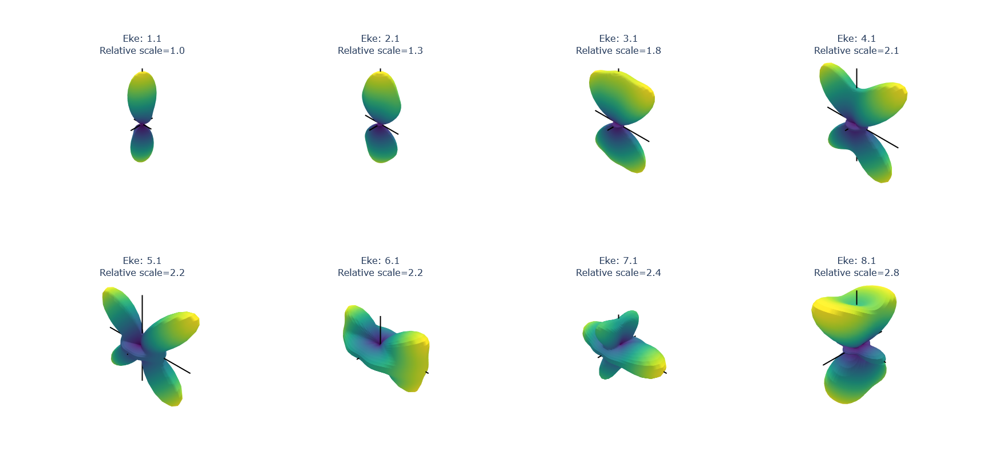

Set plot to self.data['orb7-orb10_B1U']['plots']['MFBLM']['polar']


In [23]:
# import panel as pn
# pn.extension('plotly')
# hvPlotters.setPlotters(width = 1200, height=2000)    # width, height currently failing for Plotly too...? Weird...
# Plot single pol geom only...
selDims = {'Labels':'z'}
data.padPlot(keys = ['orb7-orb10_B1U'], dataType = 'MFBLM', Erange=[1,9], backend = 'pl', selDims=selDims, width = 1400, height=800, returnFlag=True)   # Ah, pass directly OK
# data.padPlot(keys = ['orb7-orb10_B1U'], dataType = 'MFBLM', Erange=[1,9], backend = 'pl', width = 1400, height=800, returnFlag=True) 

In [24]:
# data.padPlot(keys = ['orb10'], dataType = 'MFBLM', Erange=[1,9], backend = 'pl', selDims={'Labels':'x'}, width = 1400, height=800)   # Ah, pass directly OK

In [25]:
# data.padPlot(keys = ['orb10'], dataType = 'MFBLM', Erange=[1,9], backend = 'pl', selDims={'Labels':'y'}, width = 1400, height=800)   # Ah, pass directly OK

In [26]:
# data.padPlot(keys = ['orb8-orb10_B1U'], dataType = 'MFBLM', Erange=[1,9], backend = 'pl', selDims={'Labels':'z'}, width = 1400, height=800, returnFlag=True)   # Ah, pass directly OK
data.padPlot(keys = ['orb8-orb10_B1U'], dataType = 'MFBLM', Erange=[1,9], backend = 'pl', selDims=selDims, width = 1400, height=800, returnFlag=True)

Using default sph betas.
Summing over dims: set()
Plotting from self.data[orb8-orb10_B1U][MFBLM], facetDims=['Eke', None], pType=a with backend=pl.
*** WARNING: plot dataset has min value < 0, min = (-0.00048532542122668894-9.64939933512099e-18j). This may be unphysical and/or result in plotting issues.


Set plot to self.data['orb8-orb10_B1U']['plots']['MFBLM']['polar']


In [27]:
# Diff MFPADs

# data.data['diff'] = {'TX': data.data['orb8-orb10_B1U']['TX'].sum('Sym')-data.data['orb7-orb10_B1U']['TX'].sum('Sym')}  # Add sum over sym to force matching dims
data.data['diff'] = {'TX':data.data['orb8-orb10_B1U']['plots']['MFBLM']['pData'] - data.data['orb7-orb10_B1U']['plots']['MFBLM']['pData']}
data.padPlot(keys = ['diff'], dataType = 'TX', Erange=[1,9], backend = 'pl', width = 1400, height=800,)

Summing over dims: set()
Plotting from self.data[diff][TX], facetDims=['Eke', None], pType=a2 with backend=pl.
*** WARNING: plot dataset has min value < 0, min = -0.2595568340844395. This may be unphysical and/or result in plotting issues.


## Versions

In [28]:
# print(data.jobInfo['ePolyScat'][0])
# print('Run: ' + jobInfo['Starting'][0].split('at')[1])

In [29]:
import scooby
scooby.Report(additional=['epsproc', 'xarray', 'jupyter'])

--------------------------------------------------------------------------------
  Date: Wed Mar 26 13:57:04 2025 EDT

                OS : Linux
            CPU(s) : 64
           Machine : x86_64
      Architecture : 64bit
               RAM : 62.8 GiB
       Environment : Jupyter
       File system : btrfs

  Python 3.10.11 | packaged by conda-forge | (main, May 10 2023, 18:58:44)
  [GCC 11.3.0]

           epsproc : 1.3.2-dev
            xarray : 2022.3.0
           jupyter : Version unknown
             numpy : 1.23.5
             scipy : 1.10.1
           IPython : 8.13.2
        matplotlib : 3.5.3
            scooby : 0.7.2
--------------------------------------------------------------------------------

In [30]:
# Check current Git commit for local ePSproc version
!git -C {Path(ep.__file__).parent} branch
!git -C {Path(ep.__file__).parent} log --format="%H" -n 1

* 3d-AFPAD-dev
  dev
  master
56c01f0a1f3ba90c1409a32a276c241e04165638


In [31]:
# Check current remote commits
!git ls-remote --heads https://github.com/phockett/ePSproc

56c01f0a1f3ba90c1409a32a276c241e04165638	refs/heads/3d-AFPAD-dev
ff437df39999292cefaa659749067b063db68ce8	refs/heads/dependabot/pip/notes/envs/envs-versioned/ipython-8.10.0
840c9a0fdbd9b1a66f5a0275ea7fa6db2193c8a6	refs/heads/dependabot/pip/notes/envs/envs-versioned/jinja2-3.1.5
0e5e04353d0fbf2da5b5de120a1e87d03de865dd	refs/heads/dependabot/pip/notes/envs/envs-versioned/tornado-6.4.2
a00ba1c9e762c85bdae2de68d4b93214ddee9063	refs/heads/dependabot/pip/notes/envs/envs-versioned/wheel-0.38.1
7e4270370d66df44c334675ac487c87d702408da	refs/heads/dev
1c0b8fd409648f07c85f4f20628b5ea7627e0c4e	refs/heads/master
69cd89ce5bc0ad6d465a4bd8df6fba15d3fd1aee	refs/heads/numba-tests
ea30878c842f09d525fbf39fa269fa2302a13b57	refs/heads/revert-9-master
baf0be0c962e8ab3c3df57c8f70f0e939f99cbd7	refs/heads/testDev


## Env

In [32]:
!hostname

8fdb9101787f


In [33]:
!conda env list

# conda environments:
#
base                  *  /opt/conda

